<a href="https://colab.research.google.com/github/Aakriti28/Generative-Adversarial-Networks/blob/master/Cycle_GAN_Tf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
pip install -q git+https://github.com/tensorflow/examples.git


In [0]:
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import os
import time
import matplotlib.pyplot as plt
from IPython.display import  clear_output

AUTOTUNE = tf.data.experimental.AUTOTUNE

In [0]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
tf.debugging.set_log_device_placement(True)
tf.config.set_soft_device_placement(True)

Num GPUs Available:  1


In [0]:
dataset, metadata = tfds.load('cycle_gan/horse2zebra', with_info=True, as_supervised=True)

train_horses, train_zebras, = dataset['trainA'], dataset['trainB']
test_horses, test_zebras, = dataset['testA'], dataset['testB']
print(test_horses)

Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelInterleaveDatasetV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssertCardinalityDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorSliceDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelInterleaveDatasetV3 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssertCardinalityDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Par

In [0]:
buffer_size = 1000
batch_size = 1
w, h = 256, 256

In [0]:
def random_crop(image):
  cropped_image = tf.image.random_crop(image, size=[w, h, 3])
  return cropped_image

def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image/127.5) - 1
  return image

def random_jitter(image):
  image = tf.image.resize(image, [286, 286], method= 
                          tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  print(image.shape)
  image = random_crop(image) 
  image = tf.image.random_flip_left_right(image)
  return image                 

In [0]:
def preprocess_train(image, label):
  image = random_jitter(image)
  image = normalize(image)
  return image

def preprocess_test(image, label):
  image = normalize(image)
  return image

In [0]:
train_horses = train_horses.map(preprocess_train, 
                        num_parallel_calls=AUTOTUNE).cache().shuffle(
                        buffer_size).batch(1)
train_zebras = train_zebras.map(preprocess_train, 
                        num_parallel_calls=AUTOTUNE).cache().shuffle(
                        buffer_size).batch(1)

test_horses = test_horses.map(preprocess_test, 
                        num_parallel_calls=AUTOTUNE).cache().shuffle(
                        buffer_size).batch(1)
test_zebras = test_zebras.map(preprocess_test, 
                        num_parallel_calls=AUTOTUNE).cache().shuffle(
                        buffer_size).batch(1)

(286, 286, 3)
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousMemoryCache in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CacheDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousRandomSeedGenerator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ShuffleDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op BatchDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
(286, 286, 3)
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CacheDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ShuffleDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op BatchDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op CacheDatas

In [0]:
sample_horse = next(iter(train_horses))
sample_zebra = next(iter(train_zebras))

Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AnonymousIteratorV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MakeIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op IteratorGetNext in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device

Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ExpandDims in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ResizeNearestNeighbor in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Squeeze in device /job:localhost/replica:0/task:0/device:GPU:0
(286, 286, 3)
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GreaterEqual in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op All in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Shape in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RandomUniformInt in device /job:localhost/replica:0/ta

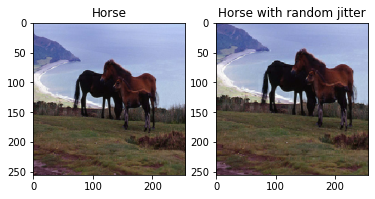

In [0]:
plt.subplot(121)
plt.title('Horse')
plt.imshow(sample_horse[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Horse with random jitter')
plt.imshow(random_jitter(sample_horse[0]) * 0.5 + 0.5)

(286, 286, 3)


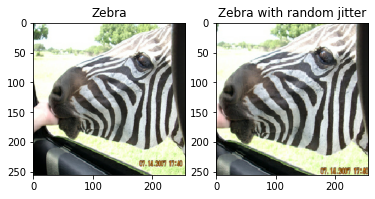

In [0]:
plt.subplot(121)
plt.title('Zebra')
plt.imshow(sample_zebra[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Zebra with random jitter')
plt.imshow(random_jitter(sample_zebra[0]) * 0.5 + 0.5)

In [0]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type = 'instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type = 'instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)


Executing op RandomStandardNormal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Conv2D in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LeakyRelu in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mean in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StopGradient in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op SquaredDifference in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Rsqrt in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Pack in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Conv2DBackpropInput in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/

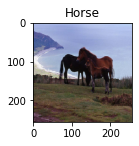

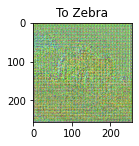

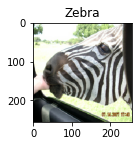

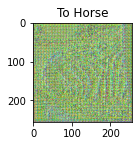

In [0]:
to_zebra = generator_g(sample_horse)
to_horse = generator_g(sample_zebra)
plt.figure(figsize = (4, 4))
contrast = 8

imgs = [sample_horse, to_zebra, sample_zebra, to_horse]
title = ['Horse', 'To Zebra', 'Zebra', 'To Horse']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
  plt.show()


Executing op Pad in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Conv2D in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StridedSlice in device /job:localhost/replica:0/task:0/device:GPU:0


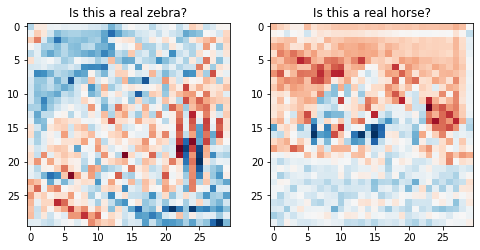

In [0]:
plt.figure(figsize = (8, 8))

plt.subplot(121)
plt.title('Is this a real zebra?')
plt.imshow(discriminator_x(sample_zebra)[0, :, :, -1], cmap = 'RdBu_r')

plt.subplot(122)
plt.title('Is this a real horse?')
plt.imshow(discriminator_y(sample_horse)[0, :, :, -1], cmap = 'RdBu_r')

In [0]:
LAMBDA = 10

loss_func = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
  real_loss = loss_func(tf.ones_like(real), real)

  generated_loss = loss_func(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss
  return total_disc_loss*0.5

def generator_loss(generated):
  return loss_func(tf.ones_like(generated), generated)


In [0]:
def calc_cycle_loss(real_image, cycled_image):
  loss = tf.reduce_mean(tf.abs(real_image - cycled_image))

  return LAMBDA * loss

def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))

  return LAMBDA * loss * 0.5

In [0]:
generator_g_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5)


In [0]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g = generator_g,
                           generator_f = generator_f,
                           discriminator_x = discriminator_x,
                           discriminator_y = discriminator_y,
                           generator_g_optimizer = generator_g_optimizer,
                           generator_f_optimizer = generator_f_optimizer,
                           discriminator_x_optimizer = discriminator_x_optimizer,
                           discriminator_y_optimizer = discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print('Latest checkpoint restored!!')

In [0]:
EPOCHS = 200

def generate_images(model, test_input):
  prediction = model(test_input)

  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [0]:
@tf.function
def train_step(real_x, real_y):

  with tf.GradientTape(persistent = True) as tape:

    fake_y = generator_g(real_x, training = True)
    cycled_x = generator_f(fake_y, training = True)

    fake_x = generator_f(real_y, training = True)
    cycled_y = generator_g(fake_x, training = True)

    same_x = generator_f(real_x, training = True)
    same_y = generator_f(real_y, training = True)


    disc_real_x = discriminator_x(real_x, training = True)
    disc_real_y = discriminator_y(real_y, training = True)

    disc_fake_x = discriminator_x(fake_x, training = True)
    disc_fake_y = discriminator_y(fake_y, training = True)


    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)


    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)


  generator_g_gradients = tape.gradient(total_gen_g_loss,
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss,
                                        generator_f.trainable_variables)
  
  discriminator_x_gradients = tape.gradient(disc_x_loss,
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss,
                                            discriminator_y.trainable_variables)


  generator_g_optimizer.apply_gradients(zip(generator_g_gradients,
                                            generator_g.trainable_variables))
  generator_f_optimizer.apply_gradients(zip(generator_f_gradients,
                                            generator_f.trainable_variables))
  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))
  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))



Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op __inference_train_step_71665 in device /job:localhost/replica:0/task:0/device:GPU:0
...........................................................................................................

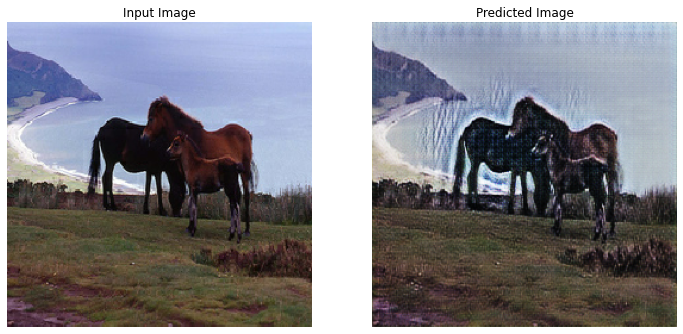

Time taken for epoch 1 is 406.17850518226624 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

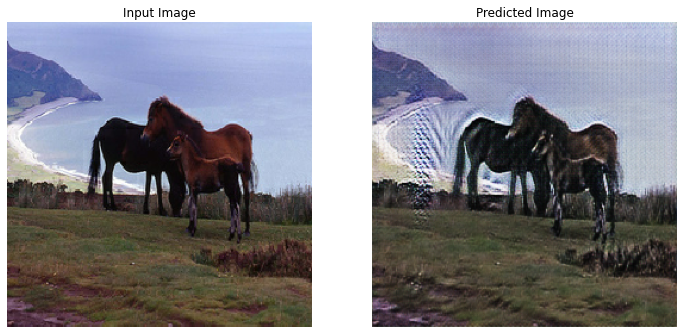

Time taken for epoch 2 is 393.845498085022 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

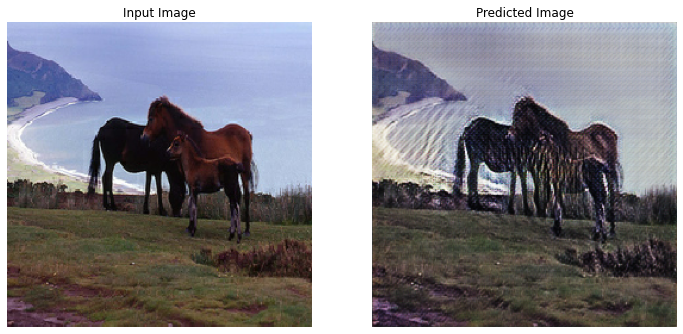

Time taken for epoch 3 is 393.7718286514282 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

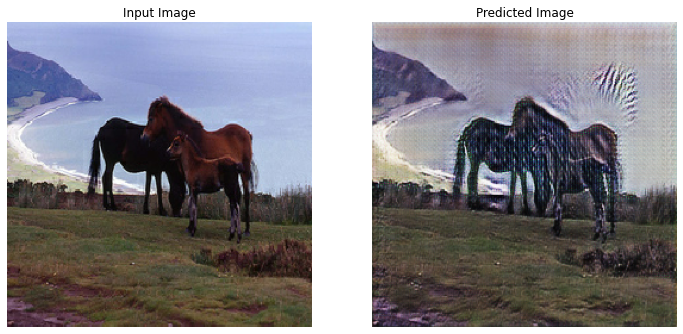

Time taken for epoch 4 is 393.8278739452362 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

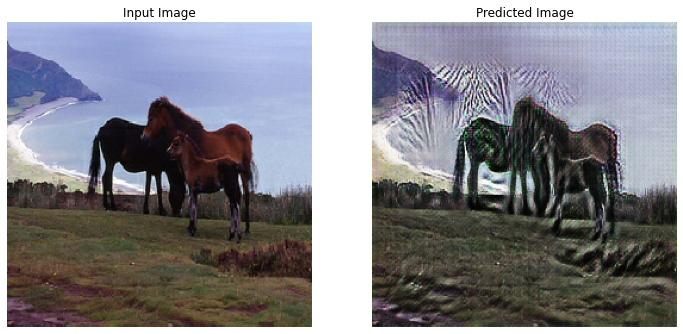

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AssignAddVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StaticRegexFullMatch in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Select in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op StringJoin in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ShardedFilename in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Identi

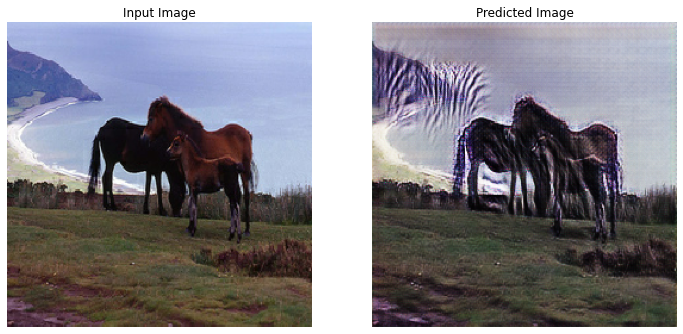

Time taken for epoch 6 is 393.86674451828003 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

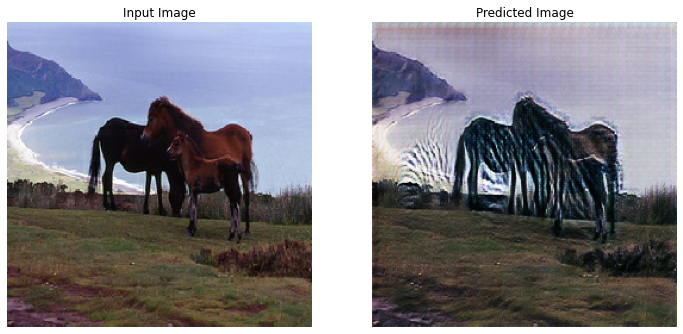

Time taken for epoch 7 is 393.2660765647888 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

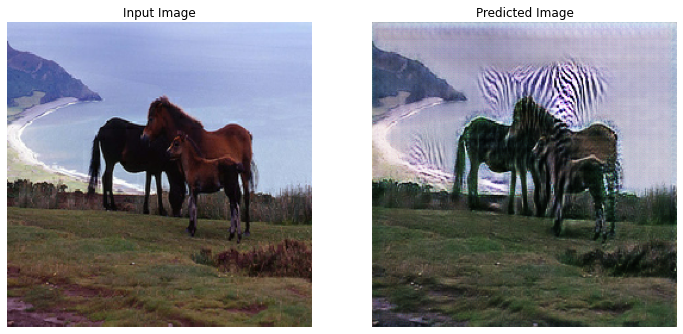

Time taken for epoch 8 is 393.050701379776 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

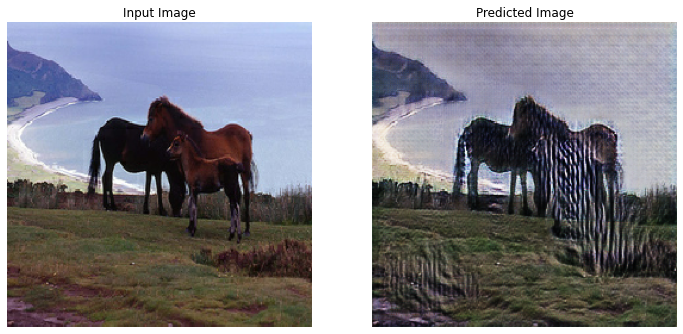

Time taken for epoch 9 is 392.8874499797821 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

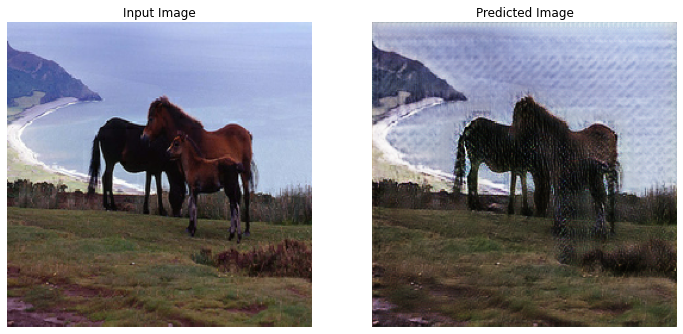

Saving checkpoint for epoch 10 at ./checkpoints/train/ckpt-2
Time taken for epoch 10 is 399.30841541290283 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

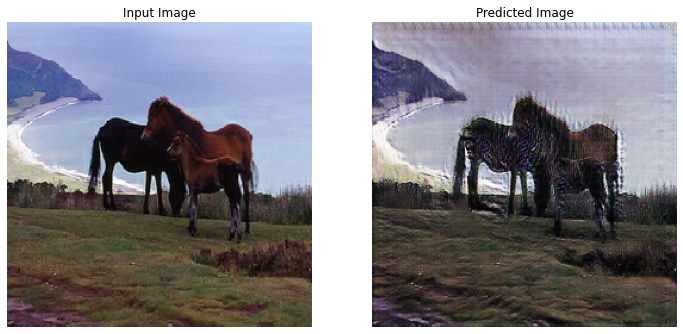

Time taken for epoch 11 is 393.93826627731323 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

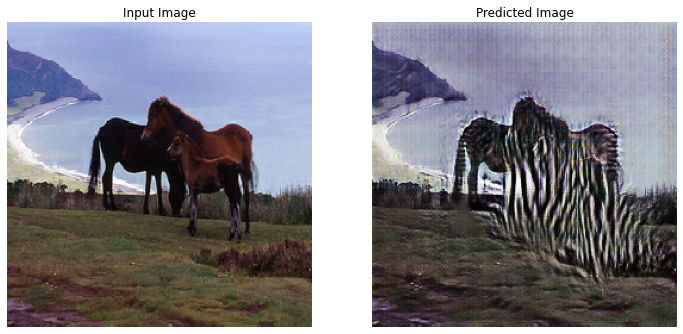

Time taken for epoch 12 is 393.6366536617279 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

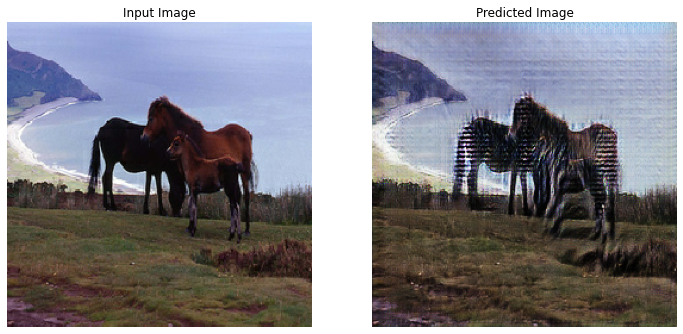

Time taken for epoch 13 is 393.7415509223938 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

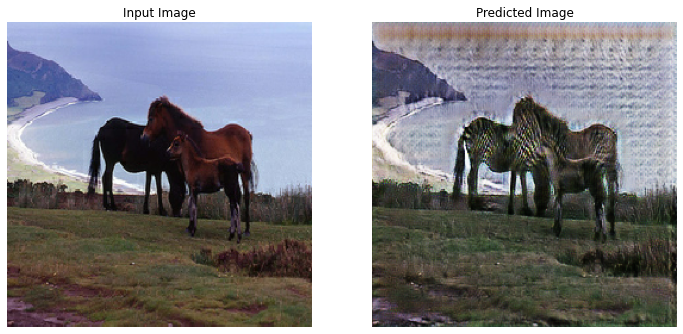

Time taken for epoch 14 is 393.2378933429718 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

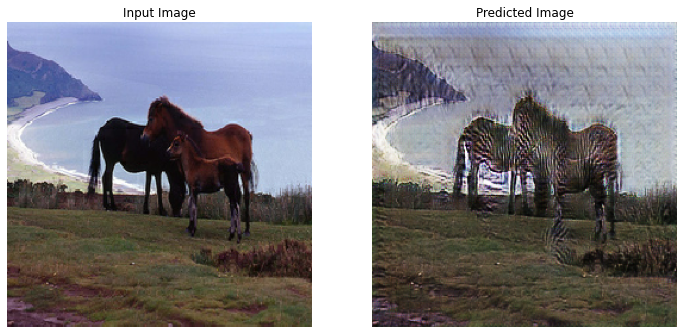

Saving checkpoint for epoch 15 at ./checkpoints/train/ckpt-3
Time taken for epoch 15 is 399.7371816635132 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

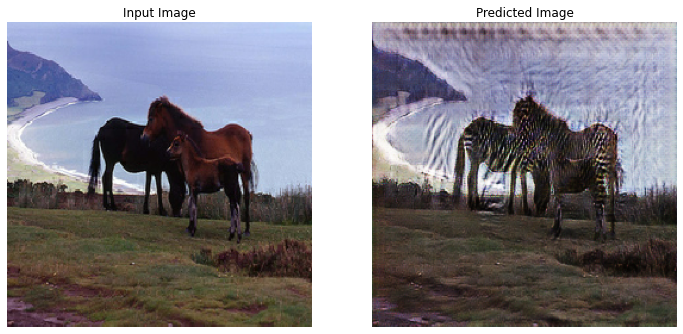

Time taken for epoch 16 is 393.2408685684204 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

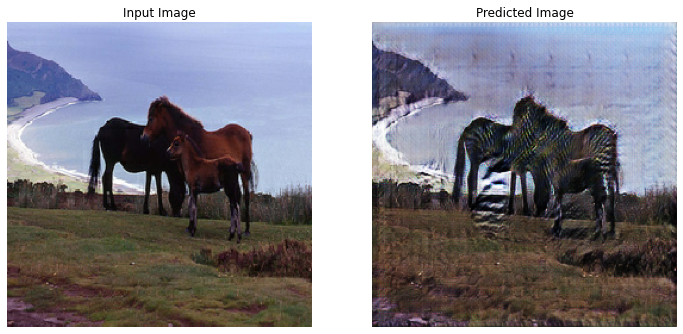

Time taken for epoch 17 is 393.07336163520813 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

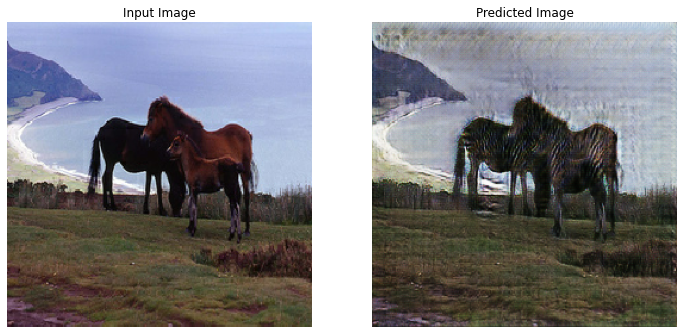

Time taken for epoch 18 is 393.1814036369324 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

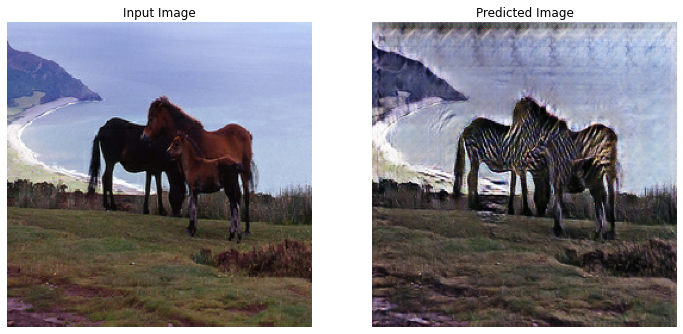

Time taken for epoch 19 is 393.3755524158478 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

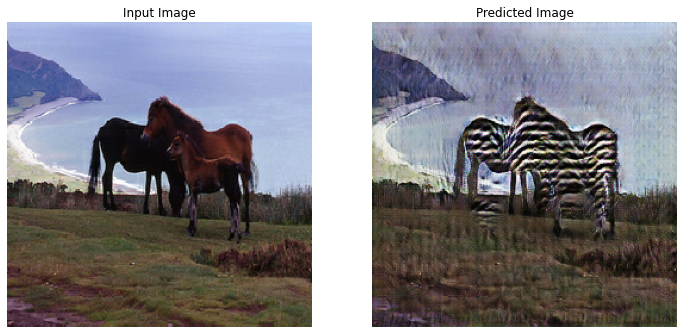

Saving checkpoint for epoch 20 at ./checkpoints/train/ckpt-4
Time taken for epoch 20 is 398.8759186267853 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

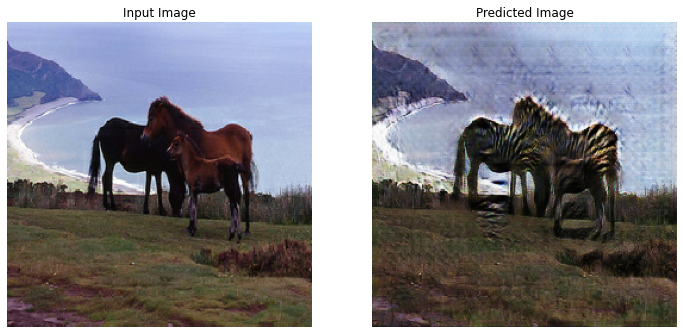

Time taken for epoch 21 is 393.41411232948303 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

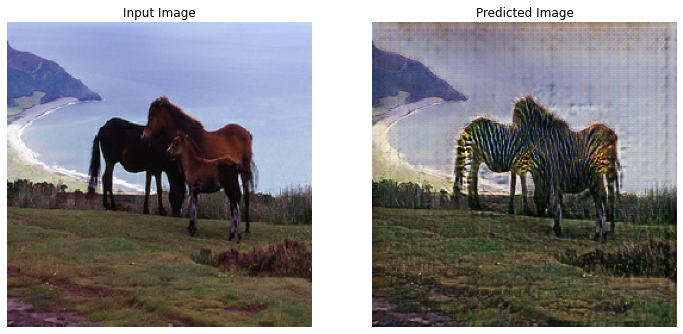

Time taken for epoch 22 is 393.7287926673889 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

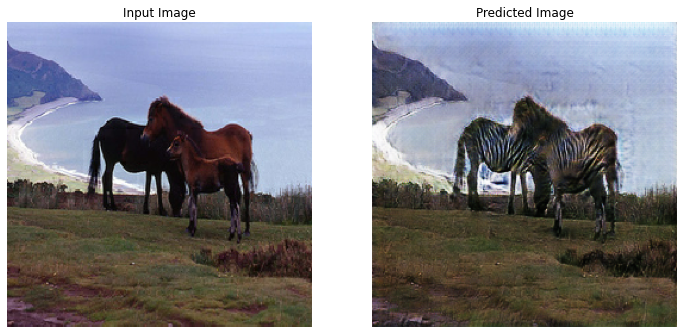

Time taken for epoch 23 is 393.5273108482361 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

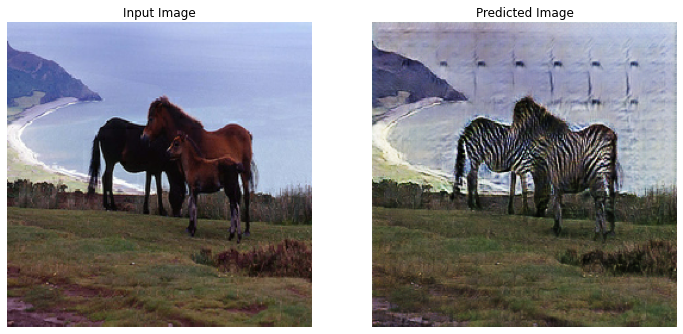

Time taken for epoch 24 is 393.67411160469055 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

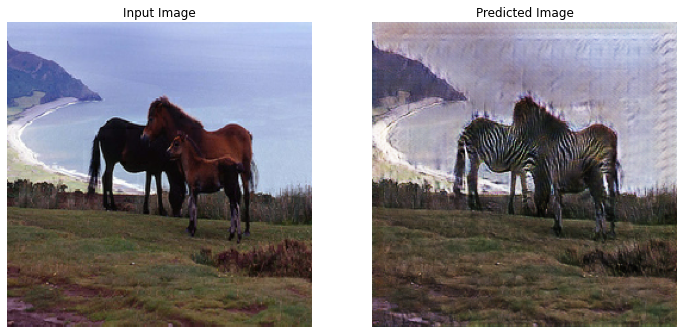

Saving checkpoint for epoch 25 at ./checkpoints/train/ckpt-5
Time taken for epoch 25 is 399.5095851421356 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

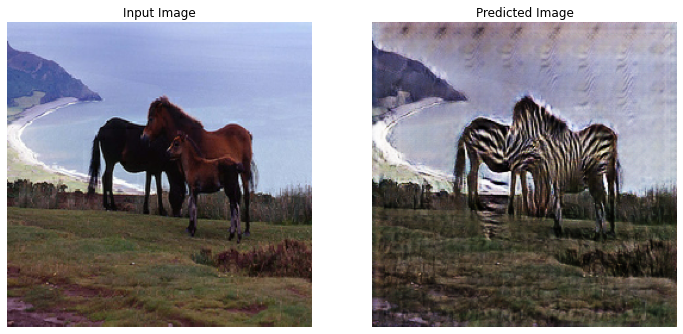

Time taken for epoch 26 is 393.4372181892395 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

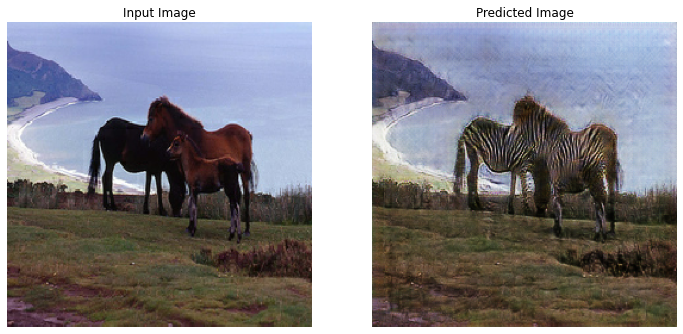

Time taken for epoch 27 is 393.0478267669678 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

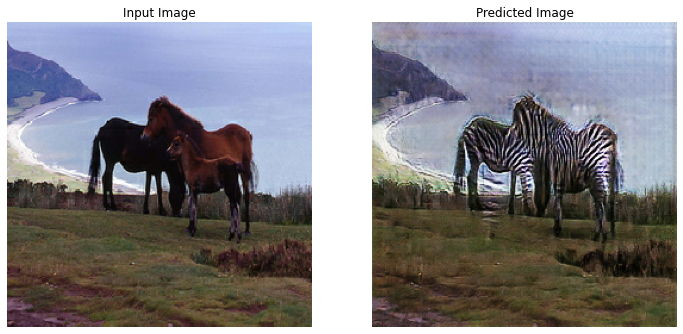

Time taken for epoch 28 is 393.40176033973694 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

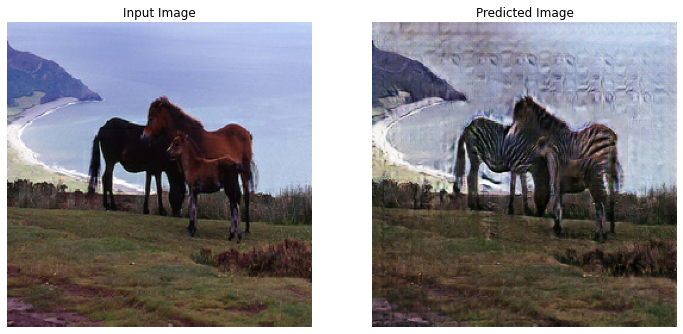

Time taken for epoch 29 is 393.11968421936035 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

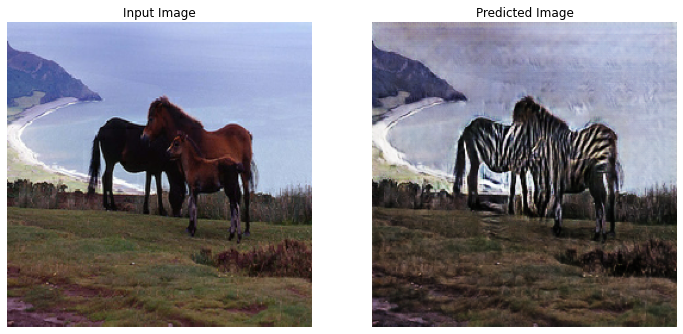

Saving checkpoint for epoch 30 at ./checkpoints/train/ckpt-6
Time taken for epoch 30 is 399.30781292915344 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
...........................................................................................................

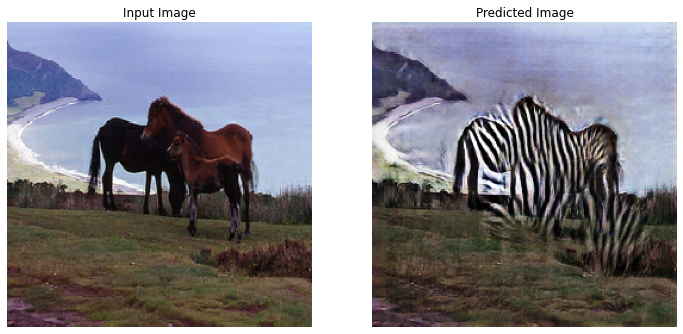

Time taken for epoch 31 is 393.35847210884094 sec

Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MaxIntraOpParallelismDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrivateThreadPoolDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
.........................................................................................................

In [0]:
for epoch in range(EPOCHS):
  start = time.time()

  n = 0
  for image_x, image_y in tf.data.Dataset.zip((train_horses, train_zebras)):
    train_step(image_x, image_y)
    if n % 10 == 0:
      print('.', end='')
    n += 1

  #clear_output(wait=True)
  generate_images(generator_g, sample_horse)

  if (epoch + 1) % 5 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))

In [0]:
# Run the trained model on the test dataset
for inp in test_horses.take(5):
  generate_images(generator_g, inp)